In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import missingno as msno
import plotly.express as px
from IPython.display import HTML
import plotly.graph_objects as go
%matplotlib inline
import seaborn as sns
import datetime as dt
from plotnine import ggplot, aes, geom_point, geom_line
import scipy
from scipy.stats import ttest_ind
import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')

In [348]:
PB = pd. read_csv("Quantium_purchase_behaviour.csv")
PB

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream
...,...,...,...
72632,2370651,MIDAGE SINGLES/COUPLES,Mainstream
72633,2370701,YOUNG FAMILIES,Mainstream
72634,2370751,YOUNG FAMILIES,Premium
72635,2370961,OLDER FAMILIES,Budget


In [5]:
PB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72637 entries, 0 to 72636
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   LYLTY_CARD_NBR    72637 non-null  int64 
 1   LIFESTAGE         72637 non-null  object
 2   PREMIUM_CUSTOMER  72637 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


In [6]:
PB.shape

(72637, 3)

<AxesSubplot:>

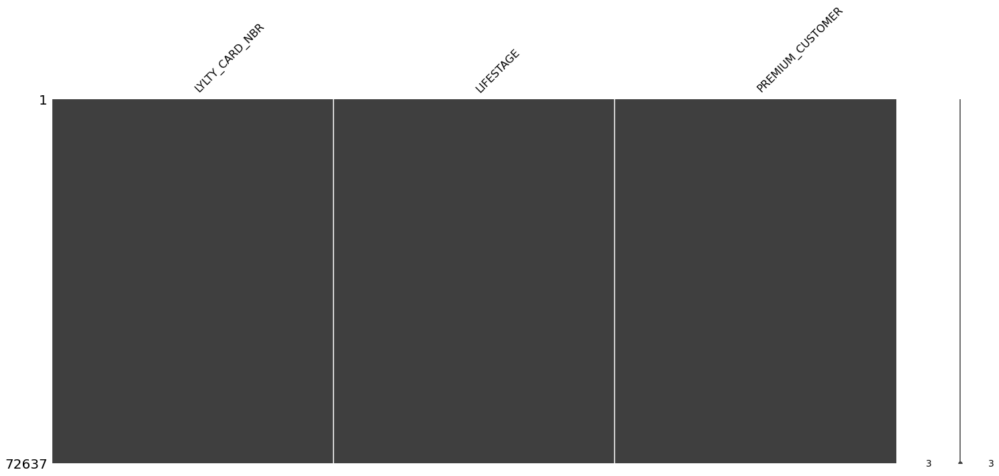

In [9]:
msno.matrix(PB)

In [349]:
TD = pd.read_excel('Quantium_transaction_data.xlsx')
TD

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,43533,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,43325,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,43410,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,43461,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


In [16]:
TD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264836 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DATE            264836 non-null  int64  
 1   STORE_NBR       264836 non-null  int64  
 2   LYLTY_CARD_NBR  264836 non-null  int64  
 3   TXN_ID          264836 non-null  int64  
 4   PROD_NBR        264836 non-null  int64  
 5   PROD_NAME       264836 non-null  object 
 6   PROD_QTY        264836 non-null  int64  
 7   TOT_SALES       264836 non-null  float64
dtypes: float64(1), int64(6), object(1)
memory usage: 16.2+ MB


In [13]:
TD.shape

(264836, 8)

<Axes: >

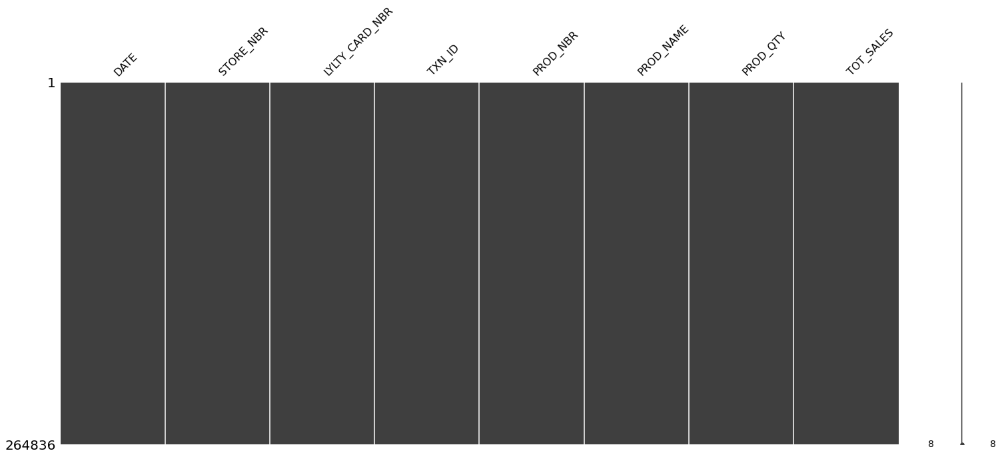

In [9]:
msno.matrix(TD)

In [350]:
TD["DATE"] = pd.to_datetime(TD["DATE"],errors ="coerce", unit = "D", origin = "1899-12-30")

In [351]:
TD

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


In [22]:
TD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264836 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   DATE            264836 non-null  datetime64[ns]
 1   STORE_NBR       264836 non-null  int64         
 2   LYLTY_CARD_NBR  264836 non-null  int64         
 3   TXN_ID          264836 non-null  int64         
 4   PROD_NBR        264836 non-null  int64         
 5   PROD_NAME       264836 non-null  object        
 6   PROD_QTY        264836 non-null  int64         
 7   TOT_SALES       264836 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(5), object(1)
memory usage: 16.2+ MB


In [23]:
TD['PROD_NAME'].values.tolist()

['Natural Chip        Compny SeaSalt175g',
 'CCs Nacho Cheese    175g',
 'Smiths Crinkle Cut  Chips Chicken 170g',
 'Smiths Chip Thinly  S/Cream&Onion 175g',
 'Kettle Tortilla ChpsHny&Jlpno Chili 150g',
 'Old El Paso Salsa   Dip Tomato Mild 300g',
 'Smiths Crinkle Chips Salt & Vinegar 330g',
 'Grain Waves         Sweet Chilli 210g',
 'Doritos Corn Chip Mexican Jalapeno 150g',
 'Grain Waves Sour    Cream&Chives 210G',
 'Smiths Crinkle Chips Salt & Vinegar 330g',
 'Kettle Sensations   Siracha Lime 150g',
 'Twisties Cheese     270g',
 'WW Crinkle Cut      Chicken 175g',
 'Thins Chips Light&  Tangy 175g',
 'CCs Original 175g',
 'Burger Rings 220g',
 'NCC Sour Cream &    Garden Chives 175g',
 'Doritos Corn Chip Southern Chicken 150g',
 'Cheezels Cheese Box 125g',
 'Smiths Crinkle      Original 330g',
 'NCC Sour Cream &    Garden Chives 175g',
 'Infzns Crn Crnchers Tangy Gcamole 110g',
 'Kettle Sea Salt     And Vinegar 175g',
 'Kettle Tortilla ChpsHny&Jlpno Chili 150g',
 'Old El Paso Salsa  

In [238]:
TD['PROD_NAME'].nunique()

114

In [42]:
TD['PROD_NAME'].value_counts().head(60).sort_values (ascending = False)

Kettle Mozzarella   Basil & Pesto 175g      3304
Kettle Tortilla ChpsHny&Jlpno Chili 150g    3296
Cobs Popd Swt/Chlli &Sr/Cream Chips 110g    3269
Tyrrells Crisps     Ched & Chives 165g      3268
Cobs Popd Sea Salt  Chips 110g              3265
Kettle 135g Swt Pot Sea Salt                3257
Tostitos Splash Of  Lime 175g               3252
Infuzions Thai SweetChili PotatoMix 110g    3242
Smiths Crnkle Chip  Orgnl Big Bag 380g      3233
Thins Potato Chips  Hot & Spicy 175g        3229
Kettle Sensations   Camembert & Fig 150g    3219
Doritos Corn Chips  Cheese Supreme 170g     3217
Pringles Barbeque   134g                    3210
Doritos Corn Chip Mexican Jalapeno 150g     3204
Kettle Sweet Chilli And Sour Cream 175g     3200
Smiths Crinkle Chips Salt & Vinegar 330g    3197
Thins Chips Light&  Tangy 175g              3188
Dorito Corn Chp     Supreme 380g            3185
Pringles Sweet&Spcy BBQ 134g                3177
Infuzions BBQ Rib   Prawn Crackers 110g     3174
Tyrrells Crisps     

In [53]:
TD['PROD_NAME'].value_counts().tail(54)

Burger Rings 220g                           1564
Natural ChipCo Sea  Salt & Vinegr 175g      1550
CCs Tasty Cheese    175g                    1539
RRD SR Slow Rst     Pork Belly 150g         1526
Smiths Thinly Cut   Roast Chicken 175g      1519
RRD Sweet Chilli &  Sour Cream 165g         1516
Woolworths Cheese   Rings 190g              1516
CCs Original 175g                           1514
RRD Honey Soy       Chicken 165g            1513
Smith Crinkle Cut   Mac N Cheese 150g       1512
WW Supreme Cheese   Corn Chips 200g         1509
Infuzions Mango     Chutny Papadums 70g     1507
RRD Chilli&         Coconut 150g            1506
Smiths Crinkle Cut  Snag&Sauce 150g         1503
Red Rock Deli Sp    Salt & Truffle 150G     1498
CCs Nacho Cheese    175g                    1498
WW Original Corn    Chips 200g              1495
Red Rock Deli Thai  Chilli&Lime 150g        1495
Woolworths Mild     Salsa 300g              1491
Smiths Crinkle Cut  Chips Barbecue 170g     1489
WW Original Stacked 

# To remove special characters

In [354]:
def remove_sp_char(COLPN,chars):
    new_COLPN=list()
    for C in COLPN:    
        for char in chars:
            if char=='&' or char=='/':
                C = C.replace(char,'')
            if char in COLPN:
                C = C.replace(char,'')
            
            C=C   
        new_COLPN.append(C)
    return new_COLPN 

In [355]:
COLPN = remove_sp_char(TD['PROD_NAME'],['&','/']) #call the fxn created

In [356]:
COLPN

['Natural Chip        Compny SeaSalt175g',
 'CCs Nacho Cheese    175g',
 'Smiths Crinkle Cut  Chips Chicken 170g',
 'Smiths Chip Thinly  SCreamOnion 175g',
 'Kettle Tortilla ChpsHnyJlpno Chili 150g',
 'Old El Paso Salsa   Dip Tomato Mild 300g',
 'Smiths Crinkle Chips Salt  Vinegar 330g',
 'Grain Waves         Sweet Chilli 210g',
 'Doritos Corn Chip Mexican Jalapeno 150g',
 'Grain Waves Sour    CreamChives 210G',
 'Smiths Crinkle Chips Salt  Vinegar 330g',
 'Kettle Sensations   Siracha Lime 150g',
 'Twisties Cheese     270g',
 'WW Crinkle Cut      Chicken 175g',
 'Thins Chips Light  Tangy 175g',
 'CCs Original 175g',
 'Burger Rings 220g',
 'NCC Sour Cream     Garden Chives 175g',
 'Doritos Corn Chip Southern Chicken 150g',
 'Cheezels Cheese Box 125g',
 'Smiths Crinkle      Original 330g',
 'NCC Sour Cream     Garden Chives 175g',
 'Infzns Crn Crnchers Tangy Gcamole 110g',
 'Kettle Sea Salt     And Vinegar 175g',
 'Kettle Tortilla ChpsHnyJlpno Chili 150g',
 'Old El Paso Salsa   Dip Tomat

In [56]:
TD['PROD_NAME'] = COLPN

In [57]:
print(TD['PROD_NAME'] [1])

CCs Nacho Cheese    175g


In [58]:
TD['PROD_PKG'] = TD ['PROD_NAME'].apply (lambda x: x.split (' ') [-1]) #to remove the last words with figs

In [59]:
TD['PROD_PKG'] 

0         SeaSalt175g
1                175g
2                170g
3                175g
4                150g
             ...     
264831           175g
264832           175g
264833           170g
264834           150g
264835           175g
Name: PROD_PKG, Length: 264836, dtype: object

In [60]:
TD['PROD_PKG'] [0] = '175g'

In [61]:
TD['PROD_NAME'] [0] = 'Natural Chip Company Sea Salt 175g'  #to split the text from the figs

In [62]:
TD

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
0,2018-10-17,1,1000,1,5,Natural Chip Company Sea Salt 175g,2,6.0,175g
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175g
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170g
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly SCreamOnion 175g,5,15.0,175g
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHnyJlpno Chili 150g,3,13.8,150g
...,...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g


# Just incase i need this step

In [67]:
New_column = pd.Series(COLPN)
New_column

0          Natural Chip        Compny SeaSalt175g
1                        CCs Nacho Cheese    175g
2          Smiths Crinkle Cut  Chips Chicken 170g
3            Smiths Chip Thinly  SCreamOnion 175g
4         Kettle Tortilla ChpsHnyJlpno Chili 150g
                           ...                   
264831    Kettle Sweet Chilli And Sour Cream 175g
264832              Tostitos Splash Of  Lime 175g
264833                   Doritos Mexicana    170g
264834    Doritos Corn Chip Mexican Jalapeno 150g
264835              Tostitos Splash Of  Lime 175g
Length: 264836, dtype: object

In [68]:
New_column.value_counts().sort_values (ascending = False)

Kettle Mozzarella   Basil  Pesto 175g      3304
Kettle Tortilla ChpsHnyJlpno Chili 150g    3296
Cobs Popd SwtChlli SrCream Chips 110g      3269
Tyrrells Crisps     Ched  Chives 165g      3268
Cobs Popd Sea Salt  Chips 110g             3265
                                           ... 
RRD Pc Sea Salt     165g                   1431
Woolworths Medium   Salsa 300g             1430
NCC Sour Cream     Garden Chives 175g      1419
French Fries Potato Chips 175g             1418
WW Crinkle Cut      Original 175g          1410
Length: 114, dtype: int64

In [81]:
DF = pd.DataFrame(New_column.value_counts().sort_values (ascending = False),  
                  columns= ['count'])
                

In [76]:
DF

,count
Kettle Mozzarella Basil Pesto 175g,3304
Kettle Tortilla ChpsHnyJlpno Chili 150g,3296
Cobs Popd SwtChlli SrCream Chips 110g,3269
Tyrrells Crisps Ched Chives 165g,3268
Cobs Popd Sea Salt Chips 110g,3265
...,...
RRD Pc Sea Salt 165g,1431
Woolworths Medium Salsa 300g,1430
NCC Sour Cream Garden Chives 175g,1419
French Fries Potato Chips 175g,1418


# Make a copy of TD

In [63]:
TD2 = TD.copy() #incase i make an error

In [66]:
TD2.tail()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g
264835,2018-09-22,272,272380,270189,74,Tostitos Splash Of Lime 175g,2,8.8,175g


In [65]:
TD2['PROD_NAME'].str.contains('Salsa').value_counts()

PROD_NAME
False    246742
True      18094
Name: count, dtype: int64

In [67]:
Value =TD2['PROD_NAME'].str.contains('Salsa')
Value

0         False
1         False
2         False
3         False
4         False
          ...  
264831    False
264832    False
264833    False
264834    False
264835    False
Name: PROD_NAME, Length: 264836, dtype: bool

In [68]:
TD2[Value] #all rows with salsa

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
5,2019-05-19,4,4074,2982,57,Old El Paso Salsa Dip Tomato Mild 300g,1,5.1,300g
25,2019-05-15,39,39144,35506,57,Old El Paso Salsa Dip Tomato Mild 300g,1,5.1,300g
32,2019-05-20,45,45127,41122,64,Red Rock Deli SR Salsa Mzzrlla 150g,2,5.4,150g
44,2018-08-18,56,56013,50090,39,Smiths Crinkle Cut Tomato Salsa 150g,1,2.6,150g
63,2019-05-15,82,82480,82047,101,Doritos Salsa Medium 300g,1,2.6,300g
...,...,...,...,...,...,...,...,...,...
264675,2019-04-20,265,265103,263419,59,Old El Paso Salsa Dip Tomato Med 300g,1,5.1,300g
264678,2019-03-30,265,265111,263428,35,Woolworths Mild Salsa 300g,1,1.5,300g
264719,2018-10-28,266,266278,264104,39,Smiths Crinkle Cut Tomato Salsa 150g,1,2.6,150g
264734,2019-01-11,267,267324,264374,41,Doritos Salsa Mild 300g,1,2.6,300g


# OR -use this method if you dont want to use the drop fxn

In [69]:
TD3 = TD2[TD2['PROD_NAME'].str.contains('Salsa')== False] #to get all the rows without SALSA

In [70]:
TD3

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
0,2018-10-17,1,1000,1,5,Natural Chip Company Sea Salt 175g,2,6.0,175g
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175g
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170g
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly SCreamOnion 175g,5,15.0,175g
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHnyJlpno Chili 150g,3,13.8,150g
...,...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g


In [71]:
TD3.describe()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_QTY,TOT_SALES
count,246742,246742.000000,2.467420e+05,2.467420e+05,246742.000000,246742.000000,246742.000000
mean,2018-12-30 01:19:01.211467520,135.051098,1.355310e+05,1.351311e+05,56.351789,1.908062,7.321322
min,2018-07-01 00:00:00,1.000000,1.000000e+03,1.000000e+00,1.000000,1.000000,1.700000
25%,2018-09-30 00:00:00,70.000000,7.001500e+04,6.756925e+04,26.000000,2.000000,5.800000
50%,2018-12-30 00:00:00,130.000000,1.303670e+05,1.351830e+05,53.000000,2.000000,7.400000
75%,2019-03-31 00:00:00,203.000000,2.030840e+05,2.026538e+05,87.000000,2.000000,8.800000
max,2019-06-30 00:00:00,272.000000,2.373711e+06,2.415841e+06,114.000000,200.000000,650.000000
std,NaN,76.787096,8.071528e+04,7.814772e+04,33.695428,0.659831,3.077828


In [72]:
TD3[TD3['PROD_QTY'] == 200]

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
69762,2018-08-19,226,226000,226201,4,Dorito Corn Chp Supreme 380g,200,650.0,380g
69763,2019-05-20,226,226000,226210,4,Dorito Corn Chp Supreme 380g,200,650.0,380g


In [73]:
TD3[TD3['LYLTY_CARD_NBR'] == 226000]

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
69762,2018-08-19,226,226000,226201,4,Dorito Corn Chp Supreme 380g,200,650.0,380g
69763,2019-05-20,226,226000,226210,4,Dorito Corn Chp Supreme 380g,200,650.0,380g


# Removing the two columns

In [74]:
TD4 = TD3[TD3['LYLTY_CARD_NBR']!= 226000] 

In [75]:
TD4

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
0,2018-10-17,1,1000,1,5,Natural Chip Company Sea Salt 175g,2,6.0,175g
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175g
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170g
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly SCreamOnion 175g,5,15.0,175g
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHnyJlpno Chili 150g,3,13.8,150g
...,...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g


In [76]:
TD4.describe().T

,count,mean,min,25%,50%,75%,max,std
DATE,246740,2018-12-30 01:18:58.448569344,2018-07-01 00:00:00,2018-09-30 00:00:00,2018-12-30 00:00:00,2019-03-31 00:00:00,2019-06-30 00:00:00,NaN
STORE_NBR,246740.0,135.050361,1.0,70.0,130.0,203.0,272.0,76.786971
LYLTY_CARD_NBR,246740.0,135530.251641,1000.0,70015.0,130367.0,203083.25,2373711.0,80715.196924
TXN_ID,246740.0,135130.360627,1.0,67568.75,135181.5,202652.25,2415841.0,78147.604242
PROD_NBR,246740.0,56.352213,1.0,26.0,53.0,87.0,114.0,33.695235
PROD_QTY,246740.0,1.906456,1.0,2.0,2.0,2.0,5.0,0.342499
TOT_SALES,246740.0,7.316113,1.7,5.8,7.4,8.8,29.5,2.474897


# Check if date column has no null values

In [77]:
TD4['DATE'].isna().sum()

0

<Axes: >

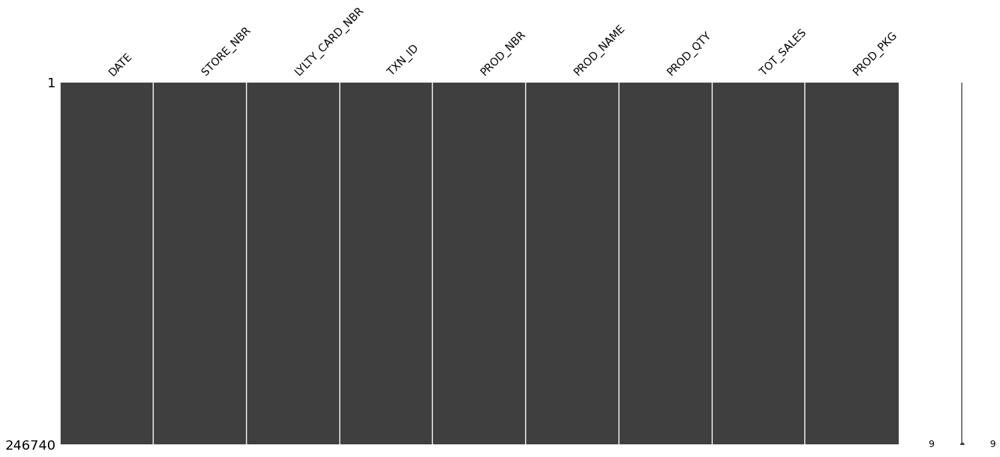

In [78]:
msno.matrix(TD4)

In [79]:
Date_group =TD4['DATE'].value_counts()
Date_group

DATE
2018-12-24    865
2018-12-23    853
2018-12-22    840
2018-12-19    839
2018-12-20    808
             ... 
2019-06-24    612
2018-10-18    611
2018-11-25    610
2018-09-22    609
2019-06-13    607
Name: count, Length: 364, dtype: int64

In [ ]:
#length shows 364 rows meaning a day is missing.. should be 365 days

In [80]:
pd.date_range(start = '2018-07-01', end = '2019-06-30').difference (Date_group.index)

DatetimeIndex(['2018-12-25'], dtype='datetime64[ns]', freq=None)

In [ ]:
#Missing date is 2018-12-25

In [81]:
Date_group = Date_group.reindex(pd.date_range('2018-07-01', '2019-06-30'),
                                fill_value =0)

In [82]:
Date_group

2018-07-01    663
2018-07-02    650
2018-07-03    674
2018-07-04    669
2018-07-05    660
             ... 
2019-06-26    657
2019-06-27    669
2019-06-28    673
2019-06-29    703
2019-06-30    704
Freq: D, Name: count, Length: 365, dtype: int64

In [83]:
TD4

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
0,2018-10-17,1,1000,1,5,Natural Chip Company Sea Salt 175g,2,6.0,175g
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175g
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170g
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly SCreamOnion 175g,5,15.0,175g
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHnyJlpno Chili 150g,3,13.8,150g
...,...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175g
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175g
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170g
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150g


In [116]:
TD4['PROD_NAME'].value_counts()

PROD_NAME
Kettle Mozzarella   Basil  Pesto 175g      3304
Kettle Tortilla ChpsHnyJlpno Chili 150g    3296
Cobs Popd SwtChlli SrCream Chips 110g      3269
Tyrrells Crisps     Ched  Chives 165g      3268
Cobs Popd Sea Salt  Chips 110g             3265
                                           ... 
RRD Pc Sea Salt     165g                   1431
NCC Sour Cream     Garden Chives 175g      1419
French Fries Potato Chips 175g             1418
WW Crinkle Cut      Original 175g          1410
Natural Chip Company Sea Salt 175g            1
Name: count, Length: 106, dtype: int64

In [119]:
TPN = TD4['PROD_NAME'].value_counts().sort_values(ascending =False)

In [120]:
TPN

PROD_NAME
Kettle Mozzarella   Basil  Pesto 175g      3304
Kettle Tortilla ChpsHnyJlpno Chili 150g    3296
Cobs Popd SwtChlli SrCream Chips 110g      3269
Tyrrells Crisps     Ched  Chives 165g      3268
Cobs Popd Sea Salt  Chips 110g             3265
                                           ... 
RRD Pc Sea Salt     165g                   1431
NCC Sour Cream     Garden Chives 175g      1419
French Fries Potato Chips 175g             1418
WW Crinkle Cut      Original 175g          1410
Natural Chip Company Sea Salt 175g            1
Name: count, Length: 106, dtype: int64

In [122]:
TPN = pd.DataFrame(TPN.items(), columns = ['PROD_NAME', 'COUNT'])

In [123]:
TPN

,PROD_NAME,COUNT
0,Kettle Mozzarella Basil Pesto 175g,3304
1,Kettle Tortilla ChpsHnyJlpno Chili 150g,3296
2,Cobs Popd SwtChlli SrCream Chips 110g,3269
3,Tyrrells Crisps Ched Chives 165g,3268
4,Cobs Popd Sea Salt Chips 110g,3265
...,...,...
101,RRD Pc Sea Salt 165g,1431
102,NCC Sour Cream Garden Chives 175g,1419
103,French Fries Potato Chips 175g,1418
104,WW Crinkle Cut Original 175g,1410


In [124]:
Date_Trans = pd.DataFrame(Date_group.items(), columns = ['DATES', 'NO_OF_TRANSACTIONS'])

In [125]:
Date_Trans

,DATES,NO_OF_TRANSACTIONS
0,2018-07-01,663
1,2018-07-02,650
2,2018-07-03,674
3,2018-07-04,669
4,2018-07-05,660
...,...,...
360,2019-06-26,657
361,2019-06-27,669
362,2019-06-28,673
363,2019-06-29,703


# Lets use GGPLOT

In [153]:
#from plotnine.data import mpg #mpg is an existing data just like economics
from plotnine import ggplot, aes, geom_point, geom_line,geom_bar

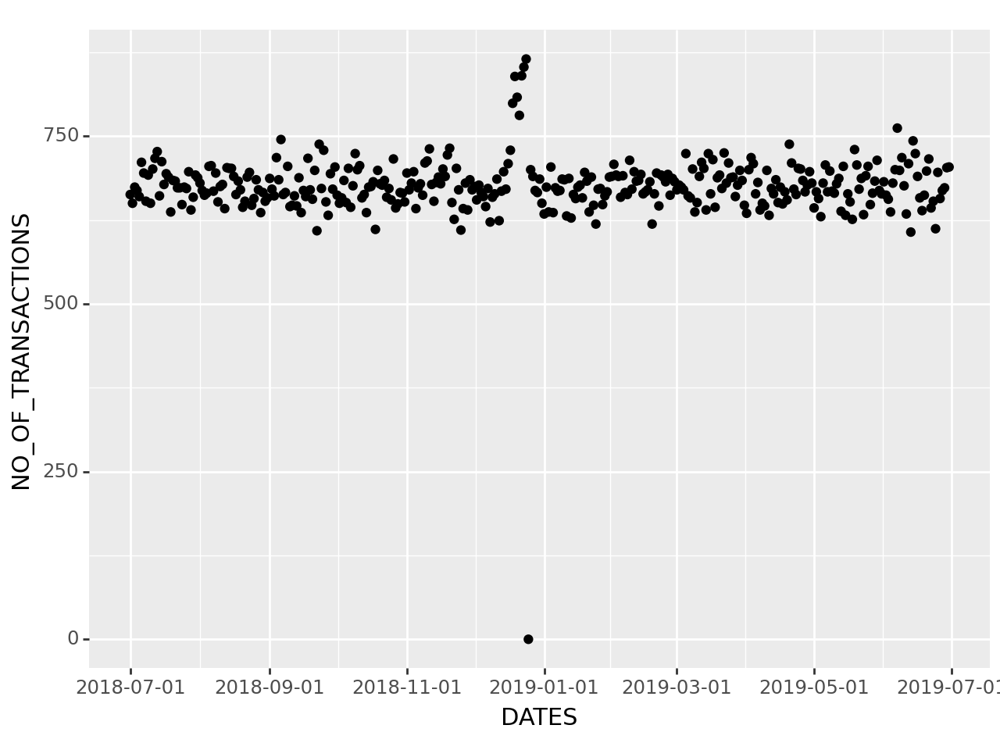

<Figure Size: (640 x 480)>

In [127]:
ggplot(Date_Trans) + aes (x = 'DATES', y = 'NO_OF_TRANSACTIONS') + geom_point() 


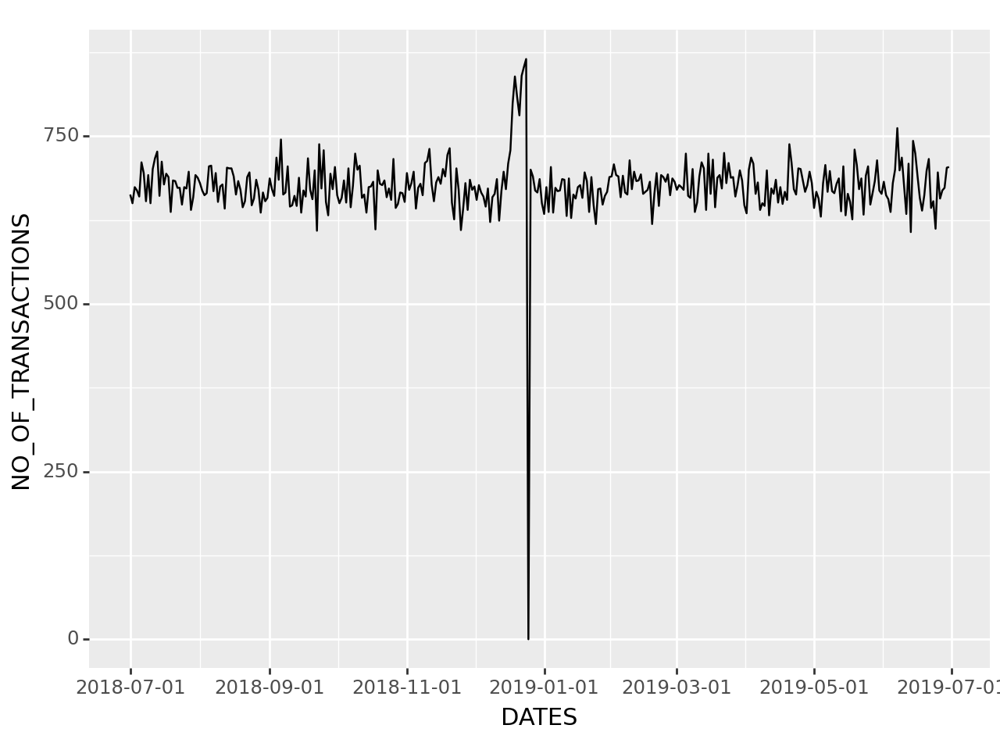

<Figure Size: (640 x 480)>

In [155]:

ggplot(Date_Trans) + aes (x = 'DATES', y = 'NO_OF_TRANSACTIONS') + geom_line() 





# can also use plotly

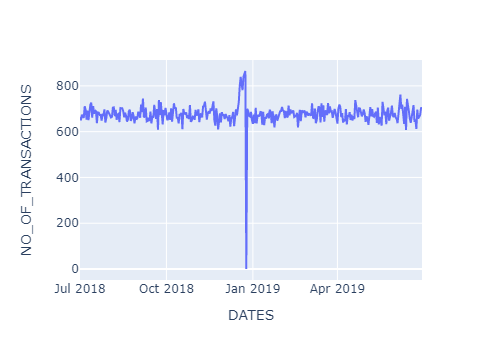

In [159]:
px.line(Date_Trans, 'DATES', 'NO_OF_TRANSACTIONS')

In [168]:
filterd = Date_Trans[(Date_Trans['DATES'] > '2018-12-1') & (Date_Trans['DATES'] <= '2018-12-31')]

In [169]:
filterd

,DATES,NO_OF_TRANSACTIONS
154,2018-12-02,655
155,2018-12-03,677
156,2018-12-04,666
157,2018-12-05,660
158,2018-12-06,645
159,2018-12-07,672
160,2018-12-08,622
161,2018-12-09,659
162,2018-12-10,664
163,2018-12-11,686


# TO REMOVE ALL CHAR in PKG

In [206]:
TD['PROD_PKG']

0         175g
1         175g
2         170g
3         175g
4         150g
          ... 
264831    175g
264832    175g
264833    170g
264834    150g
264835    175g
Name: PROD_PKG, Length: 264836, dtype: object

In [205]:
s = '175g'
s.replace('g', '')

'175'

In [217]:
# def remove_sp_char(var,chars):
#     new_var=list()
#     for v in var:    
#         for char in chars:
#             if char=='g' or char=='G':
#                 v = v.replace(char,'')
#             if char in var:
#                 v = v.replace(char,'')
            
#             v=v  
#         new_var.append(v)
#     return new_var 

In [244]:
# var = remove_sp_char(TD['PROD_PKG'],['g',''])

In [276]:
var2 = TD['PROD_PKG'].str.replace('g', '')

In [277]:
var3 = var2.str.replace('G', '')

In [279]:
var4 = var3.str.replace('Chicken', '')

In [305]:
var11 = var10.str.replace('Sea135', '')

In [306]:
var11.to_list()

['175',
 '175',
 '170',
 '175',
 '150',
 '300',
 '330',
 '210',
 '150',
 '210',
 '330',
 '150',
 '270',
 '175',
 '175',
 '175',
 '220',
 '175',
 '150',
 '125',
 '330',
 '175',
 '110',
 '175',
 '150',
 '300',
 '175',
 '175',
 '150',
 '110',
 '134',
 '134',
 '150',
 '175',
 '150',
 '175',
 '175',
 '170',
 '175',
 '150',
 '175',
 '380',
 '270',
 '175',
 '150',
 '175',
 '110',
 '110',
 '330',
 '150',
 '150',
 '175',
 '175',
 '170',
 '330',
 '110',
 '180',
 '150',
 '150',
 '165',
 '175',
 '175',
 '134',
 '300',
 '110',
 '135',
 '134',
 '380',
 '170',
 '270',
 '250',
 '300',
 '330',
 '110',
 '300',
 '175',
 '175',
 '250',
 '150',
 '175',
 '170',
 '110',
 '170',
 '150',
 '175',
 '210',
 '175',
 '300',
 '170',
 '134',
 '175',
 '175',
 '150',
 '150',
 '200',
 '175',
 '170',
 '175',
 '110',
 '175',
 '110',
 '380',
 '170',
 '170',
 '270',
 '150',
 '175',
 '175',
 '110',
 '170',
 '270',
 '200',
 '200',
 '134',
 '300',
 '150',
 '165',
 '175',
 '150',
 '175',
 '110',
 '150',
 '160',
 '150',
 '110',


In [308]:
TD4['PROD_PKG'] = var11

In [309]:
TD4

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG
0,2018-10-17,1,1000,1,5,Natural Chip Company Sea Salt 175g,2,6.0,175
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly SCreamOnion 175g,5,15.0,175
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHnyJlpno Chili 150g,3,13.8,150
...,...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150


In [310]:
TD4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 246740 entries, 0 to 264835
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   DATE            246740 non-null  datetime64[ns]
 1   STORE_NBR       246740 non-null  int64         
 2   LYLTY_CARD_NBR  246740 non-null  int64         
 3   TXN_ID          246740 non-null  int64         
 4   PROD_NBR        246740 non-null  int64         
 5   PROD_NAME       246740 non-null  object        
 6   PROD_QTY        246740 non-null  int64         
 7   TOT_SALES       246740 non-null  float64       
 8   PROD_PKG        246740 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(5), object(2)
memory usage: 26.9+ MB


# convert PROD_PKG column from object to int data type

In [311]:
TD4['PROD_PKG']= pd.to_numeric(TD4['PROD_PKG'])

In [312]:
TD4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 246740 entries, 0 to 264835
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   DATE            246740 non-null  datetime64[ns]
 1   STORE_NBR       246740 non-null  int64         
 2   LYLTY_CARD_NBR  246740 non-null  int64         
 3   TXN_ID          246740 non-null  int64         
 4   PROD_NBR        246740 non-null  int64         
 5   PROD_NAME       246740 non-null  object        
 6   PROD_QTY        246740 non-null  int64         
 7   TOT_SALES       246740 non-null  float64       
 8   PROD_PKG        246740 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(6), object(1)
memory usage: 26.9+ MB


In [316]:
TD4['PROD_PKG'].sort_values(ascending = False)

139622    380
32144     380
67137     380
249038    380
206337    380
         ... 
189801     70
50822      70
154828     70
109817     70
75215      70
Name: PROD_PKG, Length: 246740, dtype: int64

In [320]:
Prod_group = TD4['PROD_PKG'].value_counts()
Prod_group

PROD_PKG
175    66390
150    40203
134    25102
110    22387
170    19983
165    15297
330    12540
380     6416
270     6285
210     6272
200     4473
135     3257
250     3169
90      3008
190     2995
160     2970
220     1564
70      1507
180     1468
125     1454
Name: count, dtype: int64

In [321]:
Prod_Trans = pd.DataFrame(Prod_group.items(), columns = ['Prod_size_in_grams', 'NO_OF_TRANSACTIONS'])

In [322]:
Prod_Trans

,Prod_size_in_grams,NO_OF_TRANSACTIONS
0,175,66390
1,150,40203
2,134,25102
3,110,22387
4,170,19983
5,165,15297
6,330,12540
7,380,6416
8,270,6285
9,210,6272


In [331]:
from IPython.display import HTML

import plotly.express as px

In [336]:
fig = px.histogram (Prod_Trans, 
              x = Prod_Trans['Prod_size_in_grams'],
              y = Prod_Trans['NO_OF_TRANSACTIONS'],
              title = 'Trans_By_Pack_Size', 
              #text = Prod_Trans['NO_OF_TRANSACTIONS'], #same as y axis
              height = 600) #heigt = 600 is to adjust the size of the pie chart

fig.update_traces(marker_color = 'green') #text should be rounded in two 2 significant figs
HTML(fig.to_html())

In [337]:
fig = px.bar     (Prod_Trans, 
              x = Prod_Trans['Prod_size_in_grams'],
              y = Prod_Trans['NO_OF_TRANSACTIONS'],
              title = 'Trans_By_Pack_Size', 
              #text = Prod_Trans['NO_OF_TRANSACTIONS'], #same as y axis
              height = 600) #heigt = 600 is to adjust the size of the pie chart

fig.update_traces(marker_color = 'green') #text should be rounded in two 2 significant figs
HTML(fig.to_html())

Text(0.5, 0, 'Prod_size_in_grams')

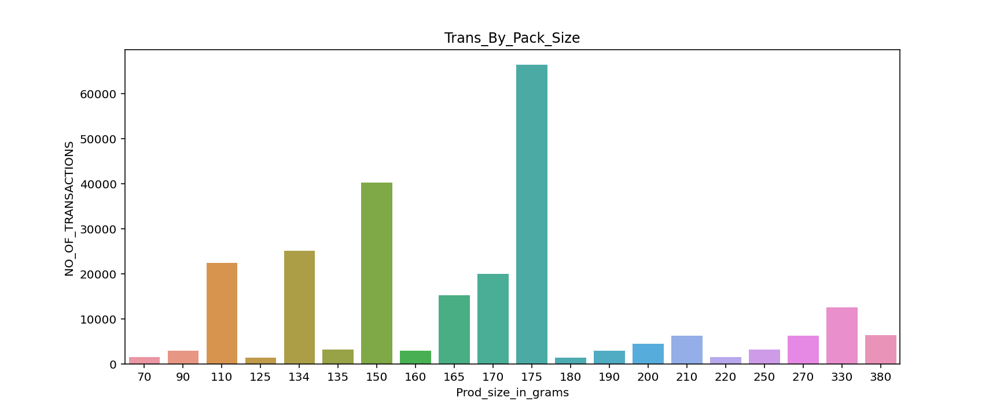

In [359]:
plt.figure(figsize=(12,5))
sns.countplot(x = 'PROD_PKG', data =TD4) 
plt.title('Trans_By_Pack_Size')
plt.ylabel('NO_OF_TRANSACTIONS'),
plt.xlabel('Prod_size_in_grams')
             

Text(0.5, 0, 'Prod_size_in_grams')

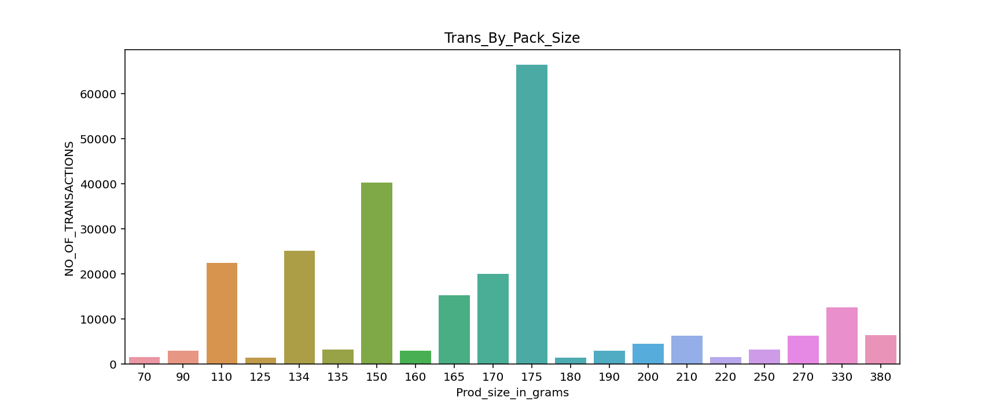

In [345]:
plt.figure(figsize=(12,5))
sns.barplot(y = 'NO_OF_TRANSACTIONS', x ='Prod_size_in_grams', data =Prod_Trans) 
plt.title('Trans_By_Pack_Size')
plt.ylabel('NO_OF_TRANSACTIONS'),
plt.xlabel('Prod_size_in_grams')

In [360]:
TD4['PROD_NAME']

0              Natural Chip Company Sea Salt 175g
1                        CCs Nacho Cheese    175g
2          Smiths Crinkle Cut  Chips Chicken 170g
3            Smiths Chip Thinly  SCreamOnion 175g
4         Kettle Tortilla ChpsHnyJlpno Chili 150g
                           ...                   
264831    Kettle Sweet Chilli And Sour Cream 175g
264832              Tostitos Splash Of  Lime 175g
264833                   Doritos Mexicana    170g
264834    Doritos Corn Chip Mexican Jalapeno 150g
264835              Tostitos Splash Of  Lime 175g
Name: PROD_NAME, Length: 246740, dtype: object

In [364]:
TD4['PROD_BRAND'] = TD4['PROD_NAME'].apply (lambda x: x.split (' ') [0]) 

In [367]:
TD4['PROD_BRAND'].tolist()


['Natural',
 'CCs',
 'Smiths',
 'Smiths',
 'Kettle',
 'Smiths',
 'Grain',
 'Doritos',
 'Grain',
 'Smiths',
 'Kettle',
 'Twisties',
 'WW',
 'Thins',
 'CCs',
 'Burger',
 'NCC',
 'Doritos',
 'Cheezels',
 'Smiths',
 'NCC',
 'Infzns',
 'Kettle',
 'Kettle',
 'Smiths',
 'Kettle',
 'Red',
 'Infzns',
 'Pringles',
 'Pringles',
 'Thins',
 'Red',
 'Smiths',
 'Kettle',
 'Doritos',
 'Thins',
 'Smiths',
 'Natural',
 'Dorito',
 'Twisties',
 'Smiths',
 'Kettle',
 'Infzns',
 'Infuzions',
 'Smiths',
 'Kettle',
 'Smith',
 'Kettle',
 'Thins',
 'Smiths',
 'Smiths',
 'Infuzions',
 'GrnWves',
 'Doritos',
 'Kettle',
 'Tyrrells',
 'Kettle',
 'Kettle',
 'Pringles',
 'Infuzions',
 'Kettle',
 'Pringles',
 'Dorito',
 'Doritos',
 'Twisties',
 'Twisties',
 'Smiths',
 'Cobs',
 'Natural',
 'Kettle',
 'Twisties',
 'Doritos',
 'Kettle',
 'Smiths',
 'Cobs',
 'Smiths',
 'Smiths',
 'Kettle',
 'Grain',
 'French',
 'Doritos',
 'Pringles',
 'Kettle',
 'Kettle',
 'RRD',
 'Doritos',
 'WW',
 'Kettle',
 'Doritos',
 'Thins',
 'Cobs

In [371]:
var12 =TD4['PROD_BRAND'] .str.replace('Red', 'RRD')

In [372]:
var12.tolist()

['Natural',
 'CCs',
 'Smiths',
 'Smiths',
 'Kettle',
 'Smiths',
 'Grain',
 'Doritos',
 'Grain',
 'Smiths',
 'Kettle',
 'Twisties',
 'WW',
 'Thins',
 'CCs',
 'Burger',
 'NCC',
 'Doritos',
 'Cheezels',
 'Smiths',
 'NCC',
 'Infzns',
 'Kettle',
 'Kettle',
 'Smiths',
 'Kettle',
 'RRD',
 'Infzns',
 'Pringles',
 'Pringles',
 'Thins',
 'RRD',
 'Smiths',
 'Kettle',
 'Doritos',
 'Thins',
 'Smiths',
 'Natural',
 'Dorito',
 'Twisties',
 'Smiths',
 'Kettle',
 'Infzns',
 'Infuzions',
 'Smiths',
 'Kettle',
 'Smith',
 'Kettle',
 'Thins',
 'Smiths',
 'Smiths',
 'Infuzions',
 'GrnWves',
 'Doritos',
 'Kettle',
 'Tyrrells',
 'Kettle',
 'Kettle',
 'Pringles',
 'Infuzions',
 'Kettle',
 'Pringles',
 'Dorito',
 'Doritos',
 'Twisties',
 'Twisties',
 'Smiths',
 'Cobs',
 'Natural',
 'Kettle',
 'Twisties',
 'Doritos',
 'Kettle',
 'Smiths',
 'Cobs',
 'Smiths',
 'Smiths',
 'Kettle',
 'Grain',
 'French',
 'Doritos',
 'Pringles',
 'Kettle',
 'Kettle',
 'RRD',
 'Doritos',
 'WW',
 'Kettle',
 'Doritos',
 'Thins',
 'Cobs

In [373]:
var12 =TD4['PROD_BRAND'] 

In [379]:
TD4.tail(60)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG,PROD_BRAND
264775,2018-12-01,269,269204,266270,58,Red Rock Deli ChiknGarlic Aioli 150g,2,5.4,150,Red
264776,2019-01-02,269,269204,266271,79,Smiths Chip Thinly CutSaltVinegr175g,2,6.0,175,Smiths
264777,2019-01-13,269,269204,266272,46,Kettle Original 175g,2,10.8,175,Kettle
264778,2019-06-02,269,269204,266273,67,RRD Chilli Coconut 150g,2,5.4,150,RRD
264779,2018-11-02,269,269222,266381,19,Smiths Crinkle Cut SnagSauce 150g,2,5.2,150,Smiths
264781,2019-02-08,269,269222,266383,11,RRD Pc Sea Salt 165g,2,6.0,165,RRD
264782,2019-04-07,269,269222,266384,72,WW Crinkle Cut Original 175g,2,3.4,175,WW
264783,2018-07-16,270,270002,266604,31,Infzns Crn Crnchers Tangy Gcamole 110g,2,7.6,110,Infzns
264784,2018-07-27,270,270002,266605,113,Twisties Chicken270g,2,9.2,270,Twisties
264785,2018-09-14,270,270002,266606,78,Thins Chips Salt Vinegar 175g,2,6.6,175,Thins


In [380]:
PB

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream
...,...,...,...
72632,2370651,MIDAGE SINGLES/COUPLES,Mainstream
72633,2370701,YOUNG FAMILIES,Mainstream
72634,2370751,YOUNG FAMILIES,Premium
72635,2370961,OLDER FAMILIES,Budget


In [382]:
merged = TD4.merge(PB, on ='LYLTY_CARD_NBR', how= 'left')

In [383]:
merged

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG,PROD_BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Company Sea Salt 175g,2,6.0,175,Natural,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,CCs,MIDAGE SINGLES/COUPLES,Budget
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170,Smiths,MIDAGE SINGLES/COUPLES,Budget
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly SCreamOnion 175g,5,15.0,175,Smiths,MIDAGE SINGLES/COUPLES,Budget
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHnyJlpno Chili 150g,3,13.8,150,Kettle,MIDAGE SINGLES/COUPLES,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175,Kettle,YOUNG SINGLES/COUPLES,Premium
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175,Tostitos,YOUNG SINGLES/COUPLES,Premium
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170,Doritos,YOUNG SINGLES/COUPLES,Premium
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150,Doritos,YOUNG SINGLES/COUPLES,Premium


In [386]:
merged.isnull().sum()

DATE                0
STORE_NBR           0
LYLTY_CARD_NBR      0
TXN_ID              0
PROD_NBR            0
PROD_NAME           0
PROD_QTY            0
TOT_SALES           0
PROD_PKG            0
PROD_BRAND          0
LIFESTAGE           0
PREMIUM_CUSTOMER    0
dtype: int64

In [389]:
merged.to_csv("merged.csv") #meaning save the 'merged' df created as merged in csv format

In [432]:
TS = merged.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])  [['TOT_SALES']].sum().reset_index()

In [433]:
TS =TS.sort_values(by ='TOT_SALES', ascending = False)
TS

,LIFESTAGE,PREMIUM_CUSTOMER,TOT_SALES
6,OLDER FAMILIES,Budget,156863.75
19,YOUNG SINGLES/COUPLES,Mainstream,147582.20
13,RETIREES,Mainstream,145168.95
15,YOUNG FAMILIES,Budget,129717.95
9,OLDER SINGLES/COUPLES,Budget,127833.60
10,OLDER SINGLES/COUPLES,Mainstream,124648.50
11,OLDER SINGLES/COUPLES,Premium,123537.55
12,RETIREES,Budget,105916.30
7,OLDER FAMILIES,Mainstream,96413.55
14,RETIREES,Premium,91296.65


Text(0.5, 1.0, 'Sales Distribution across life')

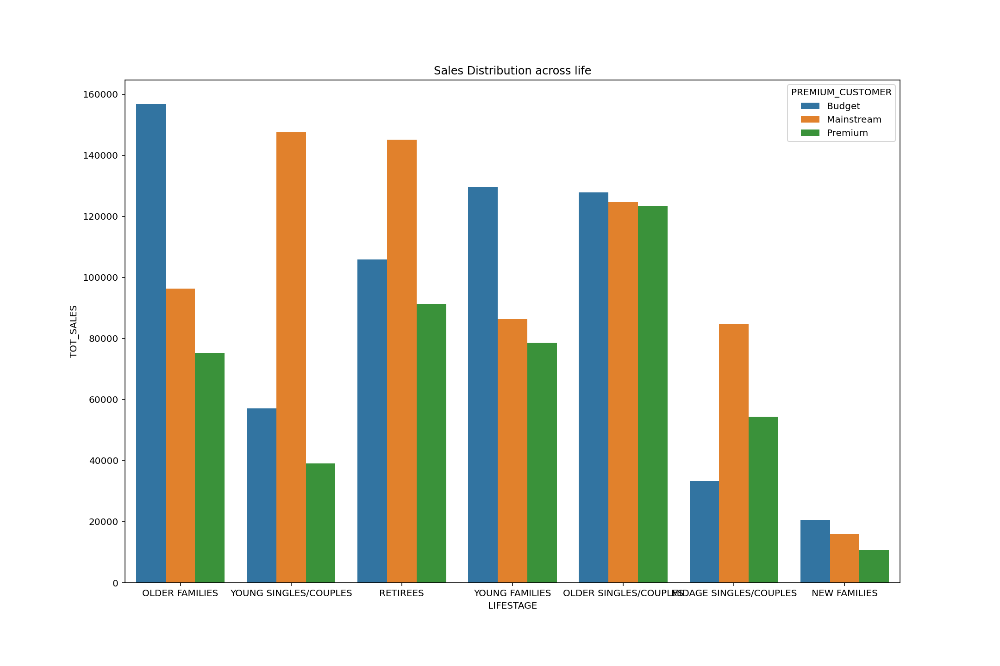

In [416]:
plt.figure(figsize=(15,10))
sns.barplot(y = 'TOT_SALES', x ='LIFESTAGE', hue = 'PREMIUM_CUSTOMER', data =TS) 
plt.title('Sales Distribution across life')
# plt.ylabel('NO_OF_TRANSACTIONS'),
# plt.xlabel('Prod_size_in_grams')

In [437]:
CS = merged.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])  [['LYLTY_CARD_NBR']].nunique().reset_index()
#nunique() so that it counts each unique Lylty card no as a single digits (card no 1001 = 1 depending on how many times it appears)

In [440]:
CS

,LIFESTAGE,PREMIUM_CUSTOMER,LYLTY_CARD_NBR
0,MIDAGE SINGLES/COUPLES,Budget,1474
1,MIDAGE SINGLES/COUPLES,Mainstream,3298
2,MIDAGE SINGLES/COUPLES,Premium,2369
3,NEW FAMILIES,Budget,1087
4,NEW FAMILIES,Mainstream,830
5,NEW FAMILIES,Premium,575
6,OLDER FAMILIES,Budget,4611
7,OLDER FAMILIES,Mainstream,2788
8,OLDER FAMILIES,Premium,2231
9,OLDER SINGLES/COUPLES,Budget,4849


In [441]:
CS =CS.rename(columns = {'LYLTY_CARD_NBR': 'LYLTY_CARD_MMBRS'})

In [457]:
CS=CS.sort_values(by = 'LYLTY_CARD_MMBRS', ascending = False)
CS

,LIFESTAGE,PREMIUM_CUSTOMER,LYLTY_CARD_MMBRS
19,YOUNG SINGLES/COUPLES,Mainstream,7917
13,RETIREES,Mainstream,6358
10,OLDER SINGLES/COUPLES,Mainstream,4858
9,OLDER SINGLES/COUPLES,Budget,4849
11,OLDER SINGLES/COUPLES,Premium,4682
6,OLDER FAMILIES,Budget,4611
12,RETIREES,Budget,4385
15,YOUNG FAMILIES,Budget,3953
14,RETIREES,Premium,3812
18,YOUNG SINGLES/COUPLES,Budget,3647


Text(0.5, 1.0, 'Sales Distribution of Customers')

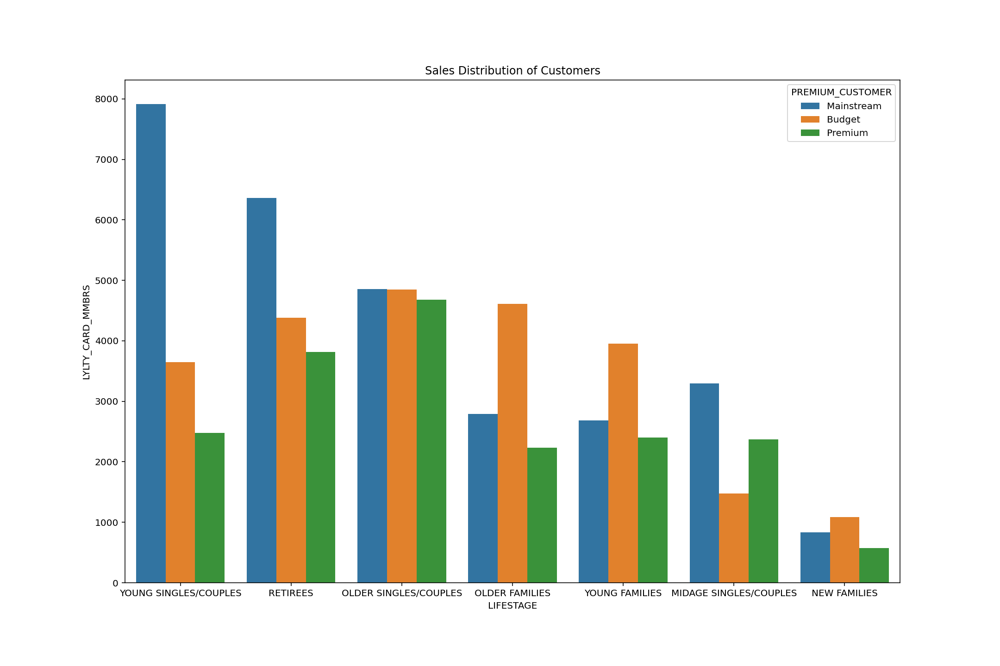

In [458]:
plt.figure(figsize=(15,10))
sns.barplot(y = 'LYLTY_CARD_MMBRS', x ='LIFESTAGE', hue = 'PREMIUM_CUSTOMER', data =CS) 
plt.title('Sales Distribution of Customers')
# plt.ylabel('NO_OF_TRANSACTIONS'),
# plt.xlabel('Prod_size_in_grams')

In [24]:
merged = pd.read_csv('merged.csv') #importing my dataset after JL lost memory of my df
merged

,Unnamed: 0,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG,PROD_BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,0,2018-10-17,1,1000,1,5,Natural Chip Company Sea Salt 175g,2,6.0,175,Natural,YOUNG SINGLES/COUPLES,Premium
1,1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,CCs,MIDAGE SINGLES/COUPLES,Budget
2,2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170,Smiths,MIDAGE SINGLES/COUPLES,Budget
3,3,2018-08-17,2,2373,974,69,Smiths Chip Thinly SCreamOnion 175g,5,15.0,175,Smiths,MIDAGE SINGLES/COUPLES,Budget
4,4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHnyJlpno Chili 150g,3,13.8,150,Kettle,MIDAGE SINGLES/COUPLES,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...,...
246735,246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175,Kettle,YOUNG SINGLES/COUPLES,Premium
246736,246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175,Tostitos,YOUNG SINGLES/COUPLES,Premium
246737,246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170,Doritos,YOUNG SINGLES/COUPLES,Premium
246738,246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150,Doritos,YOUNG SINGLES/COUPLES,Premium


In [ ]:
del merged['Unnamed: 0'] #to del the additional index column
merged

In [28]:
US = merged.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])  [['PROD_QTY']].mean().reset_index()

In [29]:
US = US.sort_values(by='PROD_QTY', ascending = False)
US

,LIFESTAGE,PREMIUM_CUSTOMER,PROD_QTY
7,OLDER FAMILIES,Mainstream,1.948795
8,OLDER FAMILIES,Premium,1.945496
6,OLDER FAMILIES,Budget,1.945384
16,YOUNG FAMILIES,Mainstream,1.941408
15,YOUNG FAMILIES,Budget,1.941226
17,YOUNG FAMILIES,Premium,1.938149
9,OLDER SINGLES/COUPLES,Budget,1.914920
11,OLDER SINGLES/COUPLES,Premium,1.913949
1,MIDAGE SINGLES/COUPLES,Mainstream,1.911942
10,OLDER SINGLES/COUPLES,Mainstream,1.911201


In [30]:
US =US.rename(columns = {'PROD_QTY': 'AVE_PROD_QTY'})

In [31]:
US

,LIFESTAGE,PREMIUM_CUSTOMER,AVE_PROD_QTY
7,OLDER FAMILIES,Mainstream,1.948795
8,OLDER FAMILIES,Premium,1.945496
6,OLDER FAMILIES,Budget,1.945384
16,YOUNG FAMILIES,Mainstream,1.941408
15,YOUNG FAMILIES,Budget,1.941226
17,YOUNG FAMILIES,Premium,1.938149
9,OLDER SINGLES/COUPLES,Budget,1.914920
11,OLDER SINGLES/COUPLES,Premium,1.913949
1,MIDAGE SINGLES/COUPLES,Mainstream,1.911942
10,OLDER SINGLES/COUPLES,Mainstream,1.911201


Text(0.5, 1.0, 'Unit Sales Distribution Per Customers')

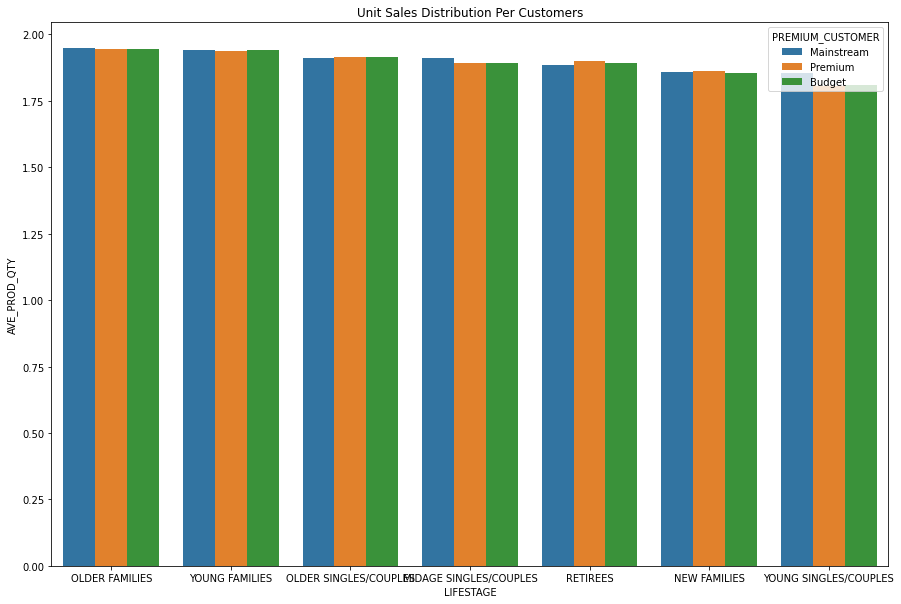

In [33]:
plt.figure(figsize=(15,10))
sns.barplot(y = 'AVE_PROD_QTY', x ='LIFESTAGE', hue = 'PREMIUM_CUSTOMER', data =US) 
plt.title('Unit Sales Distribution Per Customers')
# plt.ylabel('NO_OF_TRANSACTIONS'),
# plt.xlabel('Prod_size_in_grams')

In [37]:
merged['PRICE_PER_UNIT'] = merged['TOT_SALES'] / merged ['PROD_QTY']

In [40]:
merged

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,PROD_PKG,PROD_BRAND,LIFESTAGE,PREMIUM_CUSTOMER,PRICE_PER_UNIT
0,2018-10-17,1,1000,1,5,Natural Chip Company Sea Salt 175g,2,6.0,175,Natural,YOUNG SINGLES/COUPLES,Premium,3.00
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,CCs,MIDAGE SINGLES/COUPLES,Budget,2.10
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170,Smiths,MIDAGE SINGLES/COUPLES,Budget,1.45
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly SCreamOnion 175g,5,15.0,175,Smiths,MIDAGE SINGLES/COUPLES,Budget,3.00
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHnyJlpno Chili 150g,3,13.8,150,Kettle,MIDAGE SINGLES/COUPLES,Budget,4.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175,Kettle,YOUNG SINGLES/COUPLES,Premium,5.40
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175,Tostitos,YOUNG SINGLES/COUPLES,Premium,4.40
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170,Doritos,YOUNG SINGLES/COUPLES,Premium,4.40
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150,Doritos,YOUNG SINGLES/COUPLES,Premium,3.90


In [44]:
APS = merged.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])  [['PRICE_PER_UNIT']].mean().reset_index()
APS = APS.sort_values(by = 'PRICE_PER_UNIT',ascending = False)
APS = APS.rename(columns = {'PRICE_PER_UNIT': 'AVE_PRICE_PER_UNIT'})
APS

,LIFESTAGE,PREMIUM_CUSTOMER,AVE_PRICE_PER_UNIT
19,YOUNG SINGLES/COUPLES,Mainstream,4.065642
1,MIDAGE SINGLES/COUPLES,Mainstream,3.994241
12,RETIREES,Budget,3.924404
14,RETIREES,Premium,3.920942
3,NEW FAMILIES,Budget,3.917688
4,NEW FAMILIES,Mainstream,3.916133
11,OLDER SINGLES/COUPLES,Premium,3.893182
9,OLDER SINGLES/COUPLES,Budget,3.882096
5,NEW FAMILIES,Premium,3.872110
13,RETIREES,Mainstream,3.844294


Text(0.5, 1.0, 'Ave Price Distribution Per Customers')

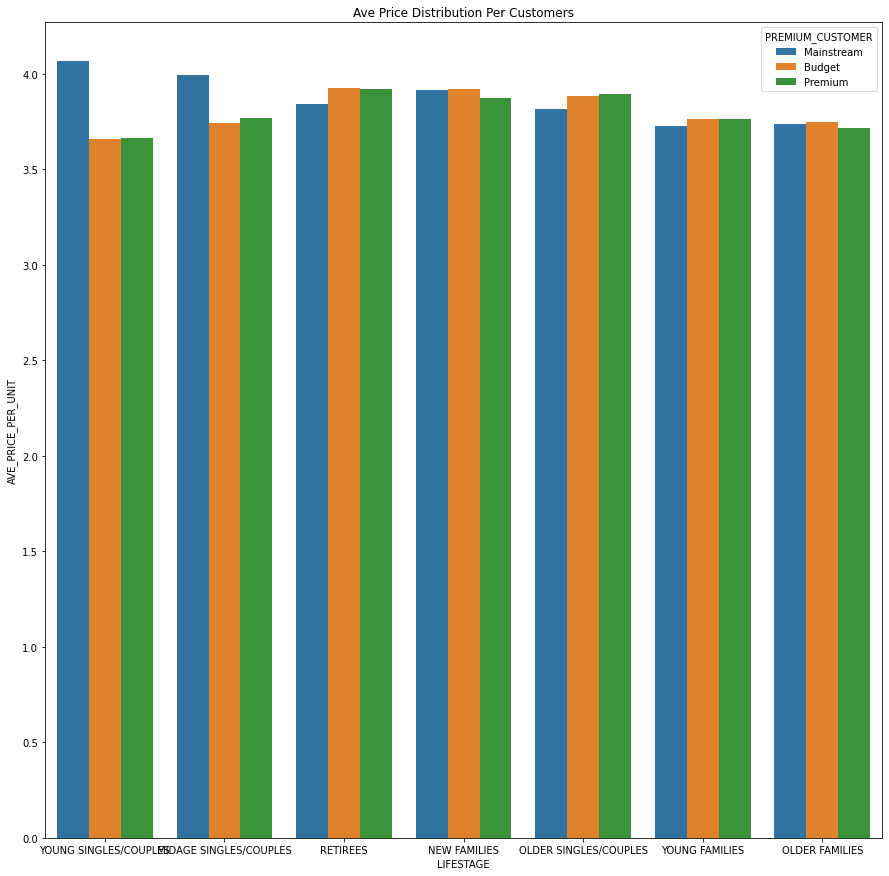

In [49]:
plt.figure(figsize=(15,15))
sns.barplot(y = 'AVE_PRICE_PER_UNIT', x ='LIFESTAGE', hue = 'PREMIUM_CUSTOMER', data =APS) 
plt.title('Ave Price Distribution Per Customers')
# plt.ylabel('NO_OF_TRANSACTIONS'),
# plt.xlabel('Prod_size_in_grams')

In [169]:
filtered = merged[(merged['LIFESTAGE'].isin(['YOUNG SINGLES/COUPLES','MIDAGE SINGLES/COUPLES'])) & (merged['PREMIUM_CUSTOMER'] == 'Mainstream')] [['LIFESTAGE', 'PREMIUM_CUSTOMER', 'PRICE_PER_UNIT']]
filtered

,LIFESTAGE,PREMIUM_CUSTOMER,PRICE_PER_UNIT
4692,MIDAGE SINGLES/COUPLES,Mainstream,4.4
4693,MIDAGE SINGLES/COUPLES,Mainstream,4.4
4694,MIDAGE SINGLES/COUPLES,Mainstream,5.4
4695,MIDAGE SINGLES/COUPLES,Mainstream,4.4
4696,MIDAGE SINGLES/COUPLES,Mainstream,4.6
...,...,...,...
240884,YOUNG SINGLES/COUPLES,Mainstream,3.8
240885,YOUNG SINGLES/COUPLES,Mainstream,4.6
240886,YOUNG SINGLES/COUPLES,Mainstream,3.7
240887,YOUNG SINGLES/COUPLES,Mainstream,3.7


In [149]:
filtered1 = merged[(merged['LIFESTAGE'].isin(['YOUNG SINGLES/COUPLES','MIDAGE SINGLES/COUPLES'])) & (merged['PREMIUM_CUSTOMER'] != 'Mainstream')] [['LIFESTAGE', 'PREMIUM_CUSTOMER', 'PRICE_PER_UNIT']] 
filtered1

,LIFESTAGE,PREMIUM_CUSTOMER,PRICE_PER_UNIT
0,YOUNG SINGLES/COUPLES,Premium,3.00
1,MIDAGE SINGLES/COUPLES,Budget,2.10
2,MIDAGE SINGLES/COUPLES,Budget,1.45
3,MIDAGE SINGLES/COUPLES,Budget,3.00
4,MIDAGE SINGLES/COUPLES,Budget,4.60
...,...,...,...
246735,YOUNG SINGLES/COUPLES,Premium,5.40
246736,YOUNG SINGLES/COUPLES,Premium,4.40
246737,YOUNG SINGLES/COUPLES,Premium,4.40
246738,YOUNG SINGLES/COUPLES,Premium,3.90


In [156]:
F=filtered.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])  [['PRICE_PER_UNIT']].sum().reset_index()
F

,LIFESTAGE,PREMIUM_CUSTOMER,PRICE_PER_UNIT
0,MIDAGE SINGLES/COUPLES,Mainstream,44316.1
1,YOUNG SINGLES/COUPLES,Mainstream,79458.9


In [155]:
F1=filtered1.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'])  [['PRICE_PER_UNIT']].sum().reset_index()
F1

,LIFESTAGE,PREMIUM_CUSTOMER,PRICE_PER_UNIT
0,MIDAGE SINGLES/COUPLES,Budget,17559.95
1,MIDAGE SINGLES/COUPLES,Premium,28702.55
2,YOUNG SINGLES/COUPLES,Budget,31354.60
3,YOUNG SINGLES/COUPLES,Premium,21450.00


# PERFORM T TEST

In [171]:
from scipy.stats import ttest_ind
import scipy.stats as stats

# T-test to check dependency of smoking on charges
Ha = 'unit price for mainstream midage & YSC are significantly greater than budget or premium midage & YSC'   # Stating the Alternate Hypothesis
Ho = "unit price for mainstream  midage & YSC are not significantly greater than budget or premium midage & YSC"   # Stating the Null Hypothesis

x = np.array(filtered[filtered.PREMIUM_CUSTOMER == 'Mainstream'].PRICE_PER_UNIT)  # Selecting charges corresponding to smokers as an array
y = np.array(filtered1[filtered1.PREMIUM_CUSTOMER. isin (['Premium', 'Budget'])].PRICE_PER_UNIT) # Selecting charges corresponding to non-smokers as an array
 # Selecting charges corresponding to non-smokers as an array

t, p_value  = stats.ttest_ind(x,y, axis = 0)  #Performing an Independent t-test

if p_value < 0.05:  # Setting our significance level at 5%
    print(f'{Ha} as the p_value ({p_value}), < 0.05')
else:
    print(f'{Ho} as the p_value ({p_value}), > 0.05')

unit price for mainstream midage & YSC are significantly greater than budget or premium midage & YSC as the p_value (2.235645611549355e-309), < 0.05


# OR

In [163]:
from scipy.stats import ttest_ind
import scipy
import scipy.stats as stats

scipy.stats.ttest_ind(filtered['PRICE_PER_UNIT'],filtered1['PRICE_PER_UNIT'])

Ttest_indResult(statistic=37.83196107667815, pvalue=2.235645611549355e-309)

# Target customer segment

In [188]:
X= merged[(merged['LIFESTAGE'] =='YOUNG SINGLES/COUPLES') & (merged['PREMIUM_CUSTOMER'] == 'Mainstream')] [['LIFESTAGE', 'PREMIUM_CUSTOMER', 'PROD_BRAND', 'PROD_PKG', 'PRICE_PER_UNIT']]
X

,LIFESTAGE,PREMIUM_CUSTOMER,PROD_BRAND,PROD_PKG,PRICE_PER_UNIT
221345,YOUNG SINGLES/COUPLES,Mainstream,Smiths,150,2.6
221346,YOUNG SINGLES/COUPLES,Mainstream,Kettle,175,5.4
221347,YOUNG SINGLES/COUPLES,Mainstream,WW,200,1.9
221348,YOUNG SINGLES/COUPLES,Mainstream,Smiths,380,5.9
221349,YOUNG SINGLES/COUPLES,Mainstream,Pringles,134,3.7
...,...,...,...,...,...
240884,YOUNG SINGLES/COUPLES,Mainstream,Cobs,110,3.8
240885,YOUNG SINGLES/COUPLES,Mainstream,Kettle,150,4.6
240886,YOUNG SINGLES/COUPLES,Mainstream,Pringles,134,3.7
240887,YOUNG SINGLES/COUPLES,Mainstream,Pringles,134,3.7


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]),
 [Text(0, 0, 'Smiths'),
  Text(1, 0, 'Kettle'),
  Text(2, 0, 'WW'),
  Text(3, 0, 'Pringles'),
  Text(4, 0, 'Cobs'),
  Text(5, 0, 'Doritos'),
  Text(6, 0, 'Grain'),
  Text(7, 0, 'Cheetos'),
  Text(8, 0, 'Tyrrells'),
  Text(9, 0, 'RRD'),
  Text(10, 0, 'GrnWves'),
  Text(11, 0, 'Infuzions'),
  Text(12, 0, 'Thins'),
  Text(13, 0, 'Twisties'),
  Text(14, 0, 'Sunbites'),
  Text(15, 0, 'CCs'),
  Text(16, 0, 'Snbts'),
  Text(17, 0, 'Cheezels'),
  Text(18, 0, 'Tostitos'),
  Text(19, 0, 'Red'),
  Text(20, 0, 'Smith'),
  Text(21, 0, 'Natural'),
  Text(22, 0, 'Dorito'),
  Text(23, 0, 'Infzns'),
  Text(24, 0, 'NCC'),
  Text(25, 0, 'Woolworths'),
  Text(26, 0, 'French'),
  Text(27, 0, 'Burger')])

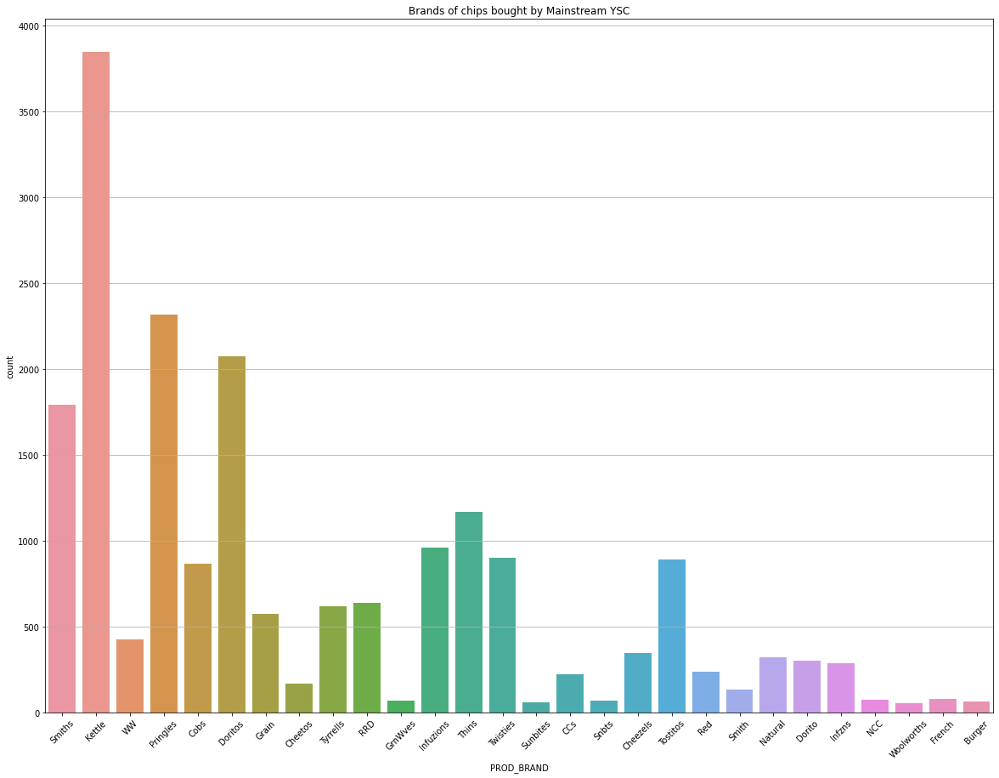

In [187]:
plt.figure(figsize=(20,15))
sns.countplot( x ='PROD_BRAND', data = X) 
plt.title('Brands of chips bought by Mainstream YSC')
plt.grid(axis='y')
plt.xticks(rotation=45)



Text(0.5, 1.0, 'brand of chips and pack sizes')

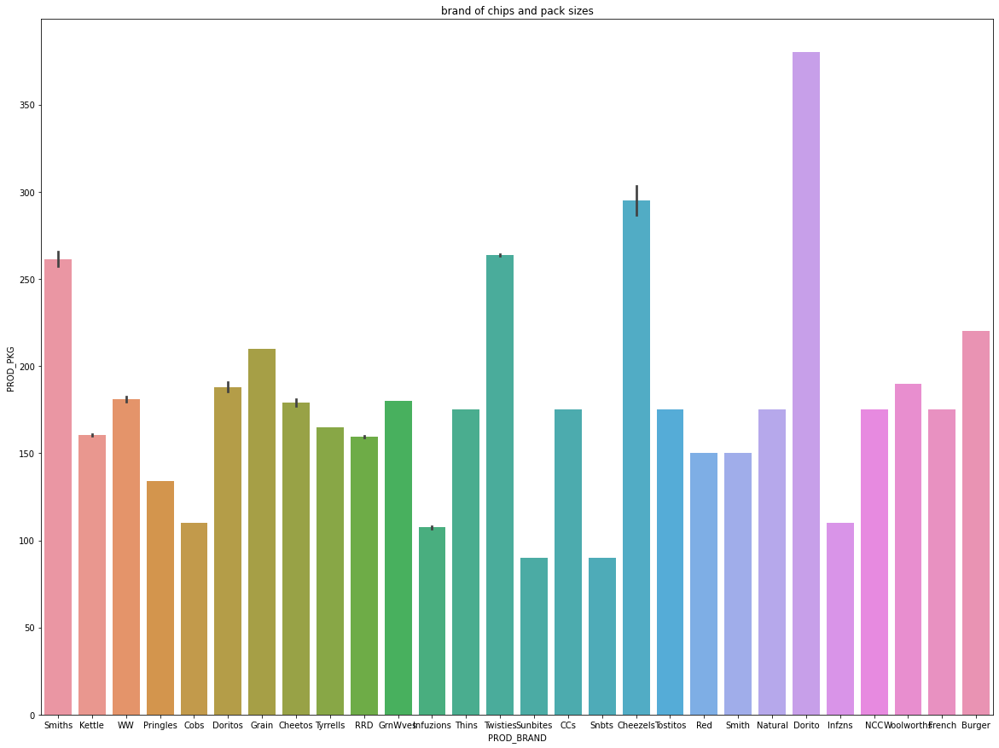

In [195]:
plt.figure(figsize=(20,15))
sns.barplot( x ='PROD_BRAND', y='PROD_PKG', data = X) 
plt.title('brand of chips and pack sizes')



Text(0.5, 1.0, 'Size of chips bought by Mainstream YSC')

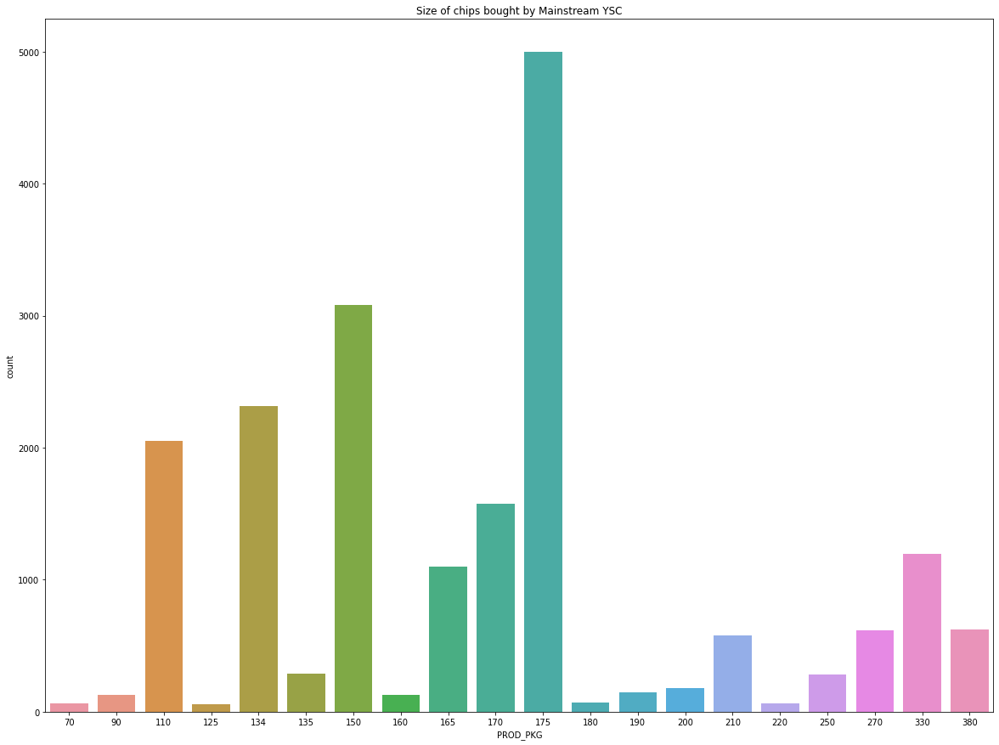

In [194]:
plt.figure(figsize=(20,15))
sns.countplot( x ='PROD_PKG', data = X) 
plt.title('Size of chips bought by Mainstream YSC')

In [236]:
Y = merged[(merged['LIFESTAGE'].isin(['YOUNG SINGLES/COUPLES','MIDAGE SINGLES/COUPLES']))] [['LIFESTAGE', 'PREMIUM_CUSTOMER', 'PROD_BRAND', 'PROD_PKG', 'PRICE_PER_UNIT']] 
Y

,LIFESTAGE,PREMIUM_CUSTOMER,PROD_BRAND,PROD_PKG,PRICE_PER_UNIT
0,YOUNG SINGLES/COUPLES,Premium,Natural,175,3.00
1,MIDAGE SINGLES/COUPLES,Budget,CCs,175,2.10
2,MIDAGE SINGLES/COUPLES,Budget,Smiths,170,1.45
3,MIDAGE SINGLES/COUPLES,Budget,Smiths,175,3.00
4,MIDAGE SINGLES/COUPLES,Budget,Kettle,150,4.60
...,...,...,...,...,...
246735,YOUNG SINGLES/COUPLES,Premium,Kettle,175,5.40
246736,YOUNG SINGLES/COUPLES,Premium,Tostitos,175,4.40
246737,YOUNG SINGLES/COUPLES,Premium,Doritos,170,4.40
246738,YOUNG SINGLES/COUPLES,Premium,Doritos,150,3.90


In [274]:
YX = merged[(merged['LIFESTAGE'].isin(['YOUNG SINGLES/COUPLES','MIDAGE SINGLES/COUPLES']))] [[ 'LIFESTAGE', 'PREMIUM_CUSTOMER','PROD_BRAND']].value_counts().reset_index() 
YX

,LIFESTAGE,PREMIUM_CUSTOMER,PROD_BRAND,count
0,YOUNG SINGLES/COUPLES,Mainstream,Kettle,3844
1,YOUNG SINGLES/COUPLES,Mainstream,Pringles,2315
2,MIDAGE SINGLES/COUPLES,Mainstream,Kettle,2136
3,YOUNG SINGLES/COUPLES,Mainstream,Doritos,2076
4,YOUNG SINGLES/COUPLES,Mainstream,Smiths,1790
...,...,...,...,...
163,MIDAGE SINGLES/COUPLES,Mainstream,Sunbites,33
164,MIDAGE SINGLES/COUPLES,Budget,Sunbites,30
165,MIDAGE SINGLES/COUPLES,Budget,GrnWves,26
166,MIDAGE SINGLES/COUPLES,Budget,French,26


In [270]:
YXX = merged[(merged['LIFESTAGE'].isin(['YOUNG SINGLES/COUPLES','MIDAGE SINGLES/COUPLES']))] [[ 'LIFESTAGE', 'PREMIUM_CUSTOMER','PROD_PKG']].value_counts().reset_index() 
YXX

,LIFESTAGE,PREMIUM_CUSTOMER,PROD_PKG,count
0,YOUNG SINGLES/COUPLES,Mainstream,175,4997
1,YOUNG SINGLES/COUPLES,Mainstream,150,3080
2,MIDAGE SINGLES/COUPLES,Mainstream,175,2975
3,YOUNG SINGLES/COUPLES,Budget,175,2338
4,YOUNG SINGLES/COUPLES,Mainstream,134,2315
...,...,...,...,...
115,MIDAGE SINGLES/COUPLES,Budget,220,43
116,MIDAGE SINGLES/COUPLES,Mainstream,125,35
117,MIDAGE SINGLES/COUPLES,Budget,125,27
118,MIDAGE SINGLES/COUPLES,Budget,70,27


In [247]:
#this step isnt necessary unless you need it
# dataencoding = YX.copy()
# dataencoding

,LIFESTAGE,PREMIUM_CUSTOMER,PROD_PKG,count
0,YOUNG SINGLES/COUPLES,Mainstream,175,4997
1,YOUNG SINGLES/COUPLES,Mainstream,150,3080
2,MIDAGE SINGLES/COUPLES,Mainstream,175,2975
3,YOUNG SINGLES/COUPLES,Budget,175,2338
4,YOUNG SINGLES/COUPLES,Mainstream,134,2315
...,...,...,...,...
115,MIDAGE SINGLES/COUPLES,Budget,220,43
116,MIDAGE SINGLES/COUPLES,Mainstream,125,35
117,MIDAGE SINGLES/COUPLES,Budget,125,27
118,MIDAGE SINGLES/COUPLES,Budget,70,27


In [248]:

# from sklearn.preprocessing import LabelEncoder

# #telling it to convert sex smoker and region on the dataencoding copy table
# dataencoding.loc[:,['LIFESTAGE']] = dataencoding.loc[:,['LIFESTAGE']].apply(LabelEncoder().fit_transform) 



Text(0.5, 1.0, 'Size of chips bought per segment')

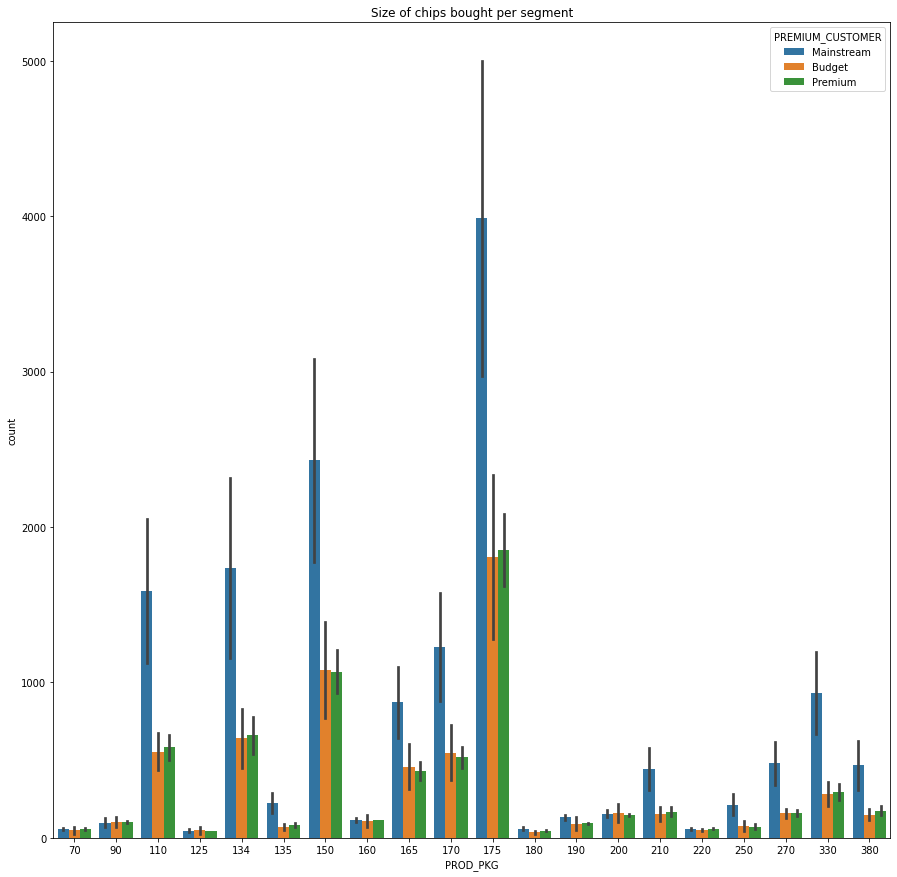

In [271]:
plt.figure(figsize=(15,15))
sns.barplot(y = 'count',  x ='PROD_PKG', hue = 'PREMIUM_CUSTOMER', data =YXX) 
plt.title('Size of chips bought per segment')

Text(0.5, 1.0, 'Size of chips bought per segment')

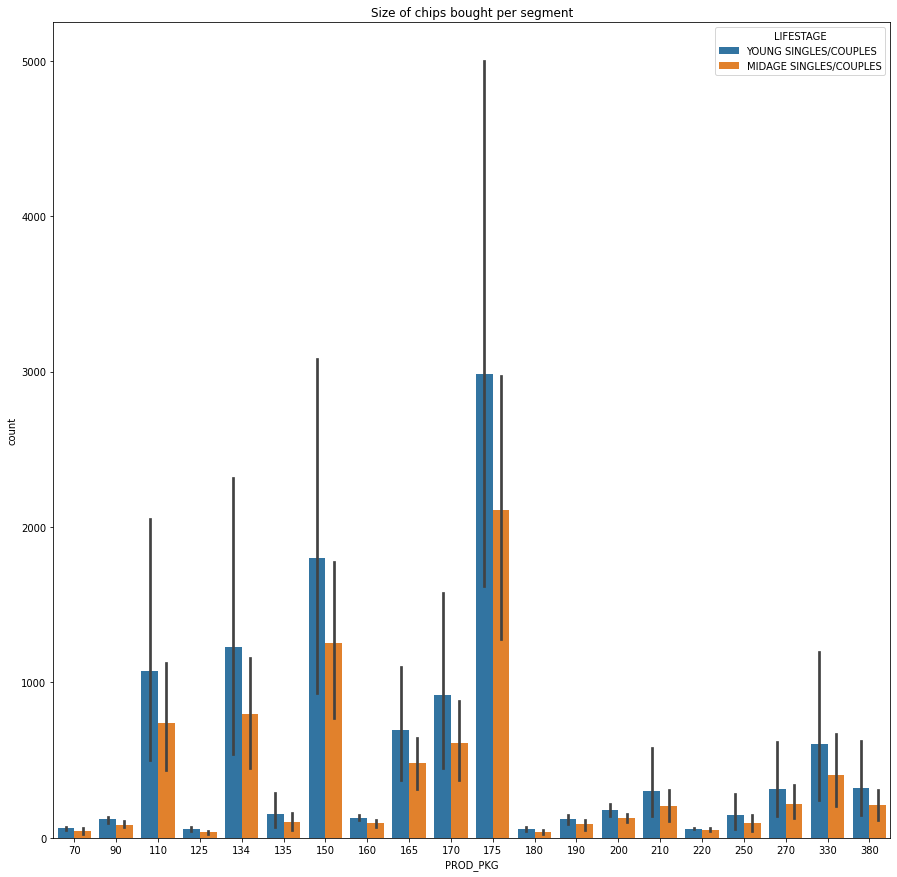

In [272]:
plt.figure(figsize=(15,15))
sns.barplot(y = 'count',  x ='PROD_PKG', hue = 'LIFESTAGE', data =YXX) 
plt.title('Size of chips bought per segment')

Text(0.5, 1.0, 'BRAND of chips bought per segment')

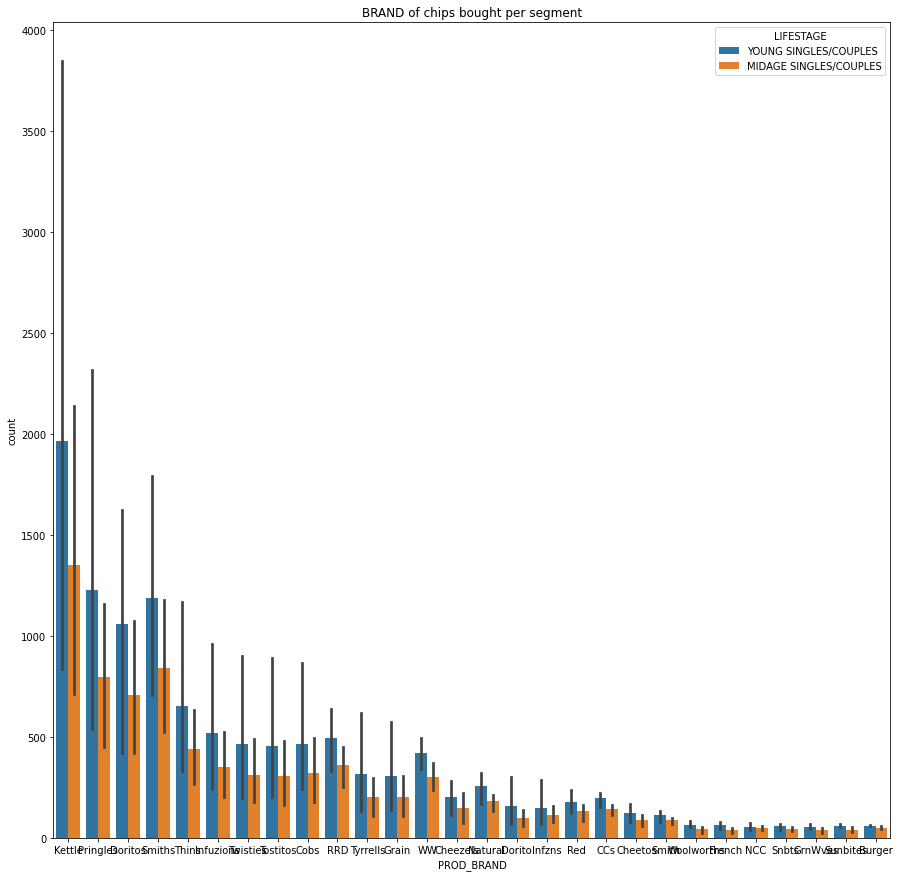

In [275]:
plt.figure(figsize=(15,15))
sns.barplot(y = 'count',  x ='PROD_BRAND', hue = 'LIFESTAGE', data =YX) 
plt.title('BRAND of chips bought per segment')

Text(0.5, 1.0, 'BRAND of chips bought per segment')

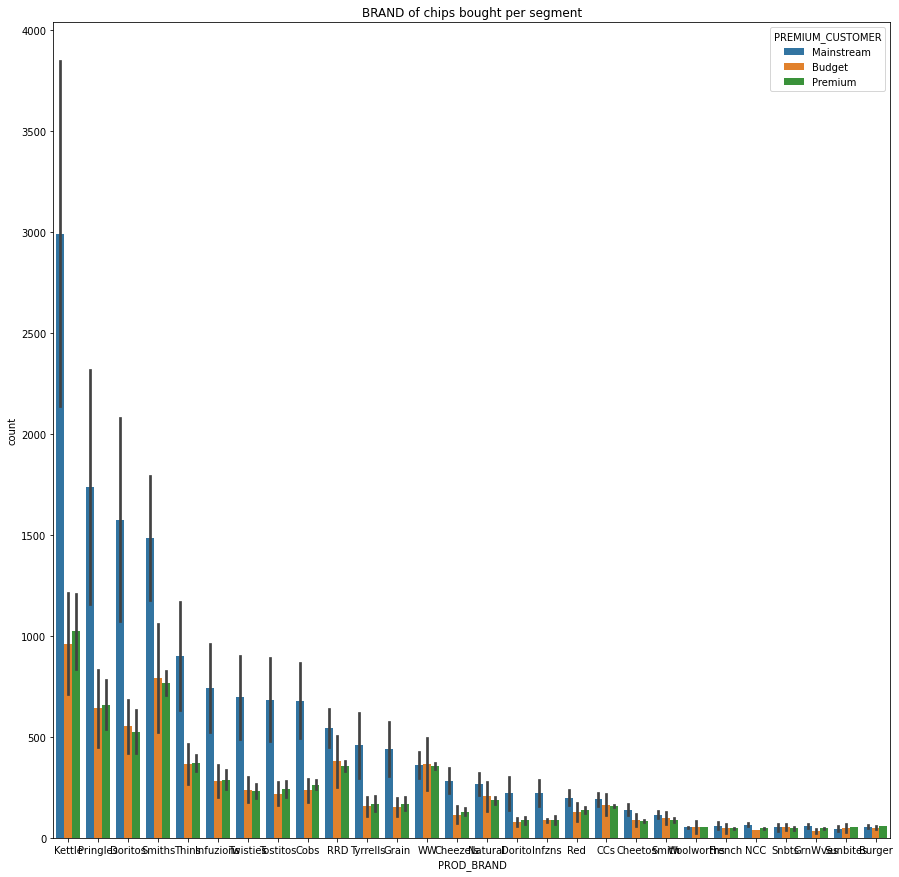

In [276]:
plt.figure(figsize=(15,15))
sns.barplot(y = 'count',  x ='PROD_BRAND', hue = 'PREMIUM_CUSTOMER', data =YX) 
plt.title('BRAND of chips bought per segment')

CONCLUSION

After the analysis some insights were found that could be communicated to the category manager for informed decision on the nature of chips sales in the region. these includes the following:

It is seen that Sales have mainly been due to Budget - older families, Mainstream - young singles/couples (YSC), and Mainstream retirees shoppers.

We found that the high spend in chips for mainstream young singles/couples and retirees is due to there being more of them than other buyers. 

Mainstream, midage and young singles and couples are also more likely to pay more per packet of chips.

From the lasts visualizations, we can also see that the Mainstream young singles and couples are more likely to to purchase the kettle chips than any other population and they mostly go for the 175g followed by the 150g pack size. When also compared with budget and premium midage and young singles and couples, we find out that the mainstream YSC result remains same.

This should be a great opportunity for the Category Manager to increase Kettle and small packs of chips in areas where Young singles and couple frequent and also improve sales of chips like Tyrells and Grain which has more consumption potentials among the YSC than other populations. This will increase visibility and further enhance impulse buying behaviour.